# EDA

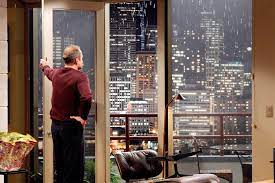

### import basic functions

In [7]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)


In [8]:
 !pip list 

Package              Version
-------------------- -----------
altair               4.2.0
anyio                3.6.2
appnope              0.1.3
argon2-cffi          21.3.0
argon2-cffi-bindings 21.2.0
asttokens            2.2.0
attrs                22.1.0
Babel                2.11.0
backcall             0.2.0
beautifulsoup4       4.11.1
bleach               5.0.1
branca               0.6.0
certifi              2022.9.24
cffi                 1.15.1
charset-normalizer   2.1.1
click                7.1.2
click-plugins        1.1.1
cligj                0.7.2
contourpy            1.0.6
cycler               0.11.0
debugpy              1.6.4
decorator            5.1.1
defusedxml           0.7.1
entrypoints          0.4
executing            1.2.0
fastjsonschema       2.16.2
Fiona                1.8.22
folium               0.13.0
fonttools            4.38.0
geopandas            0.12.1
idna                 3.4
importlib-metadata   5.1.0
ipykernel            6.17.1
ipython              8.7.0
ipython

In [3]:
import pandas as pd
import psycopg2

# Load and store (full join) dataframe from Postgres

In [8]:
import os
from dotenv import load_dotenv

load_dotenv()

DATABASE = os.getenv('DATABASE')
USER_DB = os.getenv('USER_DB')
PASSWORD = os.getenv('PASSWORD')
HOST = os.getenv('HOST')
PORT = os.getenv('PORT')

In [9]:
from sqlalchemy import create_engine

#read the database string from the .env
load_dotenv()

DB_STRING = os.getenv('DB_STRING')

db = create_engine(DB_STRING)

In [10]:
# query string
query_string = "SELECT kchd.*, kchs.* FROM  eda.king_county_house_details kchd Full JOIN eda.king_county_house_sales kchs ON kchd.id = kchs.house_id"

In [11]:
#import the data to a pandas dataframe
#query_string = "SELECT * FROM eda.king_county_house_sales"
df_sqlalchemy = pd.read_sql(query_string, db)

In [21]:
#export the data to a csv-file
df_sqlalchemy.to_csv('data/fulljoin_eda.csv',index=False)

# Import generated dataframe from CSV

In [2]:
import pandas as pd

In [6]:
#import the data from a csv-file
df = pd.read_csv('data/fulljoin_eda.csv')

In [7]:
df.shape

(21597, 23)

In [8]:
df.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id,id.1
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,3,7,...,0.0,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0,7129300520,1
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,19910.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0,6414100192,2
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,...,NaN,98028,47.7379,-122.233,2720.0,8062.0,2015-02-25,180000.0,5631500400,3
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,...,0.0,98136,47.5208,-122.393,1360.0,5000.0,2014-12-09,604000.0,2487200875,4
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,...,0.0,98074,47.6168,-122.045,1800.0,7503.0,2015-02-18,510000.0,1954400510,5


# Data preparation and new dataframe "df_clean"

In [9]:
df_clean = df.copy()

In [10]:
list(df_clean.head(0))

['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price',
 'house_id',
 'id.1']

### columns descriptions
    id - unique identified for a house
    dateDate - house was sold
    pricePrice - is prediction target
    bedroomsNumber - # of bedrooms
    bathroomsNumber - # of bathrooms
    sqft_livingsquare - footage of the home
    sqft_lotsquare - footage of the lot
    floorsTotal - floors (levels) in house
    waterfront - House which has a view to a waterfront
    view - Has been viewed
    condition - How good the condition is ( Overall )
    grade - overall grade given to the housing unit, based on King County grading system
    sqft_above - square footage of house apart from basement
    sqft_basement - square footage of the basement
    yr_built - Built Year
    yr_renovated - Year when house was renovated
    zipcode - zip
    lat - Latitude coordinate
    long - Longitude coordinate
    sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
    sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors


In [11]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

In [12]:
df_clean.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price,house_id,id.1
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19206.000000,21534.000000,21597.000000,21597.000000,...,21597.000000,17749.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,2.159700e+04,2.159700e+04,21597.000000
mean,4.580474e+09,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007602,0.233863,3.409825,7.657915,...,1970.999676,836.650516,98077.951845,47.560093,-122.213983,1986.620318,12758.283512,5.402966e+05,4.580474e+09,10799.000000
std,2.876736e+09,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086858,0.765686,0.650546,1.173200,...,29.375234,4000.110554,53.513072,0.138552,0.140724,685.230472,27274.441950,3.673681e+05,2.876736e+09,6234.661218
min,1.000102e+06,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,...,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,7.800000e+04,1.000102e+06,1.000000
25%,2.123049e+09,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,...,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,3.220000e+05,2.123049e+09,5400.000000
50%,3.904930e+09,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,...,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,4.500000e+05,3.904930e+09,10799.000000
75%,7.308900e+09,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,...,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,6.450000e+05,7.308900e+09,16198.000000
max,9.900000e+09,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,...,2015.000000,20150.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,7.700000e+06,9.900000e+09,21597.000000


In [13]:
# remove duplicate columns
df_clean.pop('house_id')
df_clean.pop('id.1')

list(df_clean.head(0))

['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price']

### check columns for type/unique elements/missing values

In [14]:
# change "date" dtype to datetime with format %Y/%m/%d
df_clean['date'] = pd.to_datetime(df_clean['date'], format='%Y/%m/%d')
type(df_clean['date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [15]:
df_clean.head(5)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,NaN,0.0,3,7,...,0.0,1955,0.0,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,400.0,1951,19910.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,...,0.0,1933,NaN,98028,47.7379,-122.233,2720.0,8062.0,2015-02-25,180000.0
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,...,910.0,1965,0.0,98136,47.5208,-122.393,1360.0,5000.0,2014-12-09,604000.0
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,...,0.0,1987,0.0,98074,47.6168,-122.045,1800.0,7503.0,2015-02-18,510000.0


In [16]:
# check if columns can be changed to int
list(df_clean.bedrooms.unique()) # make it int
list(df_clean.bathrooms.unique()) # weird but let's keep it a float
#sqft_living -> int
#sqft_lot -> int
list(df_clean.floors.unique()) # let's keep it afloat (hihi)

list(df_clean.waterfront.unique()) # replace NaN with 0 then change it to bool
list(df_clean.view.unique()) # let's change it to int and replace NaN with 0
# condition - looks good
# grade - looks good
list(df_clean.sqft_above.unique()) # let's change it to int
list(df_clean.sqft_basement.unique()) # let's change it to int and replace NaN with 0
# yr_build looks fine
list(df_clean.yr_renovated.unique()) # let's divide by 10 change it to int 
# zip is good
# lat / long are good
list(df_clean.sqft_living15.unique()) # let's change it to int
list(df_clean.sqft_lot15.unique()) # let's change it to int
# date is corrected already
list(df_clean.price.unique()) # let's change it to int

list(df_clean.head(0))


['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price']

In [2]:
import missingno as msno
#import numpy as np
#import pandas as pd


In [18]:
# show missing values
df_clean.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
dtype: int64

In [19]:
#  visualize missing values if you like:
# msno.bar(df_clean)

### test dataset excourse

In [20]:
# create a copy of the dataset to check first
df3 = df_clean.head(200).copy()

# use fillna to impute missing values
df3.fillna({'waterfront': 0, 'view': 0, 'sqft_basement':0, 'yr_renovated': np.NaN },inplace=True)
df3.isna().sum()

id                0
bedrooms          0
bathrooms         0
sqft_living       0
sqft_lot          0
floors            0
waterfront        0
view              0
condition         0
grade             0
sqft_above        0
sqft_basement     0
yr_built          0
yr_renovated     33
zipcode           0
lat               0
long              0
sqft_living15     0
sqft_lot15        0
date              0
price             0
dtype: int64

In [21]:
df3['yr_renovated'] = df3.yr_renovated.replace(np.NaN,0)

In [22]:
df3['yr_renovated'] = df3['yr_renovated'] / 10

In [23]:
# double check formatting
df3['yr_renovated']

0         0.0
1      1991.0
2         0.0
3         0.0
4         0.0
        ...  
195       0.0
196       0.0
197       0.0
198       0.0
199       0.0
Name: yr_renovated, Length: 200, dtype: float64

In [24]:
df3.price.sort_values(ascending=False)

153    2250000.0
21     2000000.0
125    1450000.0
49     1350000.0
69     1330000.0
         ...    
2       180000.0
118     171800.0
191     166950.0
183     163500.0
92      153000.0
Name: price, Length: 200, dtype: float64

In [79]:
df3['price_per_sqft'] = df3['price'] / df3['sqft_living'] 
df3.head(5)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,date,price,price_per_sqft,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_normalized_by_sqft
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,0.0,0.0,3,7,...,1340.0,5650.0,2014-10-13,221900.0,188.050847,0.583333,0.6,0.281513,0.029147,40.940959
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,1690.0,7639.0,2014-12-09,538000.0,209.338521,0.583333,0.6,0.355042,0.039408,99.261993
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,...,2720.0,8062.0,2015-02-25,180000.0,233.766234,0.500000,0.6,0.571429,0.041591,33.210332
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,...,1360.0,5000.0,2014-12-09,604000.0,308.163265,0.583333,1.0,0.285714,0.025794,111.439114
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,...,1800.0,7503.0,2015-02-18,510000.0,303.571429,0.666667,0.6,0.378151,0.038707,94.095941


In [78]:
df3['grade_normalized'] = df3['grade'] / df3['grade'].max() 
df3['condition_normalized'] = df3['condition'] / df3['condition'].max() 
df3['sqft15_normalized'] = df3['sqft_living15'] / df3['sqft_living15'].max() 
df3['lot15_normalized'] = df3['sqft_lot15'] / df3['sqft_lot15'].max() 
df3['price_per_sqft'] = df3['price'] / df3['sqft_living'] 

#multiple_families_factor = 0.33 * df3['bathrooms'] + 0.33 * df3['bedrooms'] + 0.33 * df3['floors']
#niceties_factor = sqft_lot_normalized  +  
#df3['stakeholder_cost'] = df3['price'] / (df3['sqft_living'] * (muliple_families_factor) * (niceties_factor)) #assumption: many bedrooms/bathrooms/floors are important for multiple families, sqft living is important, sqft_lot is important for living quality  

list(df3.head(0))

['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price',
 'price_per_sqft',
 'grade_normalized',
 'condition_normalized',
 'sqft15_normalized',
 'lot15_normalized',
 'price_normalized_by_sqft']

### df_clean missing values

In [26]:
df_clean.fillna({'waterfront': 0, 'view': 0, 'sqft_basement':0, 'yr_renovated': np.NaN },inplace=True)
df_clean.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront          0
view                0
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
dtype: int64

In [27]:
df_clean['yr_renovated'] = df_clean.yr_renovated.replace(np.NaN,0)
df_clean['yr_renovated'] = df_clean['yr_renovated'] / 10
df_clean['yr_renovated']

0           0.0
1        1991.0
2           0.0
3           0.0
4           0.0
          ...  
21592       0.0
21593       0.0
21594       0.0
21595       0.0
21596       0.0
Name: yr_renovated, Length: 21597, dtype: float64

### assign data types

In [28]:
df_clean = df_clean.astype({'bedrooms': int,
                            'sqft_living': int,
                            'sqft_lot': int,
                            'view': int,
                            'sqft_above': int, 
                            'sqft_basement': int, 
                            'yr_renovated': int, 
                            'sqft_living15': int,
                            'sqft_lot15': int,
                            'price': int})
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   bedrooms       21597 non-null  int64         
 2   bathrooms      21597 non-null  float64       
 3   sqft_living    21597 non-null  int64         
 4   sqft_lot       21597 non-null  int64         
 5   floors         21597 non-null  float64       
 6   waterfront     21597 non-null  float64       
 7   view           21597 non-null  int64         
 8   condition      21597 non-null  int64         
 9   grade          21597 non-null  int64         
 10  sqft_above     21597 non-null  int64         
 11  sqft_basement  21597 non-null  int64         
 12  yr_built       21597 non-null  int64         
 13  yr_renovated   21597 non-null  int64         
 14  zipcode        21597 non-null  int64         
 15  lat            2159

In [89]:
# add normalized values
df_clean['grade_normalized'] = df_clean['grade'] / df_clean['grade'].max() # normalized to itself -> range 0:1
df_clean['condition_normalized'] = df_clean['condition'] / df_clean['condition'].max() # normalized to itself -> range 0:1
df_clean['sqft15_normalized'] = df_clean['sqft_living15'] / df_clean['sqft_living15'].max() # normalized to itself -> range 0:1
df_clean['lot15_normalized'] = df_clean['sqft_lot15'] / df_clean['sqft_lot15'].max() # normalized to itself -> range 0:1
df_clean['price_per_sqft'] = df_clean['price'] / df_clean['sqft_living'] # price normalized to sqft_living
df_clean['price_per_lot'] = df_clean['price'] / df_clean['sqft_lot'] # price normalized to sqft_lot


In [90]:
df_clean.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,long,sqft_living15,sqft_lot15,price,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_per_sqft,price_per_lot
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,...,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.006760,0.233181,3.409825,7.657915,...,-122.213983,1986.620318,12758.283512,5.402966e+05,0.589070,0.681965,0.319907,0.014644,264.143368,88.988978
std,2.876736e+09,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.081944,0.764673,0.650546,1.173200,...,0.140724,685.230472,27274.441950,3.673681e+05,0.090246,0.130109,0.110343,0.031307,110.000061,94.059663
min,1.000102e+06,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,...,-122.519000,399.000000,651.000000,7.800000e+04,0.230769,0.200000,0.064251,0.000747,87.588235,0.163119
25%,2.123049e+09,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,...,-122.328000,1490.000000,5100.000000,3.220000e+05,0.538462,0.600000,0.239936,0.005854,182.291667,33.333333
50%,3.904930e+09,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,...,-122.231000,1840.000000,7620.000000,4.500000e+05,0.538462,0.600000,0.296296,0.008747,244.644550,59.262128
75%,7.308900e+09,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,...,-122.125000,2360.000000,10083.000000,6.450000e+05,0.615385,0.800000,0.380032,0.011574,318.333333,107.609531
max,9.900000e+09,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,...,-121.315000,6210.000000,871200.000000,7.700000e+06,1.000000,1.000000,1.000000,1.000000,810.138889,2019.704433


### save cleaned data set

In [100]:
# check (at least) the shape before saving
df_clean.shape

(21597, 27)

In [101]:
#export the data to a csv-file
df_clean.to_csv('data/clean_eda.csv',index=False)

In [4]:
df.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,date,price,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_per_sqft,price_per_lot
0,7129300520,3,1.000,1180,5650,1.000,0.000,0,3,7,...,1340,5650,2014-10-13,221900,0.538,0.600,0.216,0.006,188.051,39.274
1,6414100192,3,2.250,2570,7242,2.000,0.000,0,3,7,...,1690,7639,2014-12-09,538000,0.538,0.600,0.272,0.009,209.339,74.289
2,5631500400,2,1.000,770,10000,1.000,0.000,0,3,6,...,2720,8062,2015-02-25,180000,0.462,0.600,0.438,0.009,233.766,18.000
3,2487200875,4,3.000,1960,5000,1.000,0.000,0,5,7,...,1360,5000,2014-12-09,604000,0.538,1.000,0.219,0.006,308.163,120.800
4,1954400510,3,2.000,1680,8080,1.000,0.000,0,3,8,...,1800,7503,2015-02-18,510000,0.615,0.600,0.290,0.009,303.571,63.119


# import csv for df_clean

In [8]:
#import the data from a csv-file as df to not overwrite loaded dataframes
df = pd.read_csv('data/clean_eda.csv')

In [9]:
# please be careful here, you overwrite df_clean
df_clean = df.copy()

# Assumptions: 
### Erin Robinson  - Buyer - 	Invests in poor neighborhoods, buying & selling, aims for costs back + little profit, wants to be socially responsible
* many bedrooms/bathrooms/floors are important for multiple families if they don't want to build new
* sqft living is important
* sqft_lot is important for building new  
* looks for medium to poor neighbourhoods
* looks for houses for multiple families (floors/bedrooms/bathrooms/sqft)
* does not necessary need luxury
* condition/renovation date should be as good as possible

# Hypotheses / questions


* prize correlates with neighborhood
* prize correlates with size (sqft)
* prize correlates with rating / sqft
* prize correlates with \# bedrooms 
* prize correlates with \# bathrooms
* prize correlates with condition
* should we create a rating system or is this equal to 'grade' (eg. prize per wheighted sqft\*rating\*bathrooms\*bedrooms\*floors\*view)
* should end up with an sql query that gives houses with nice sqft-bathrooms/bedrooms to prize ratio in low income neighborhoods

### correlation of price per sqft./lot size with house characteristics

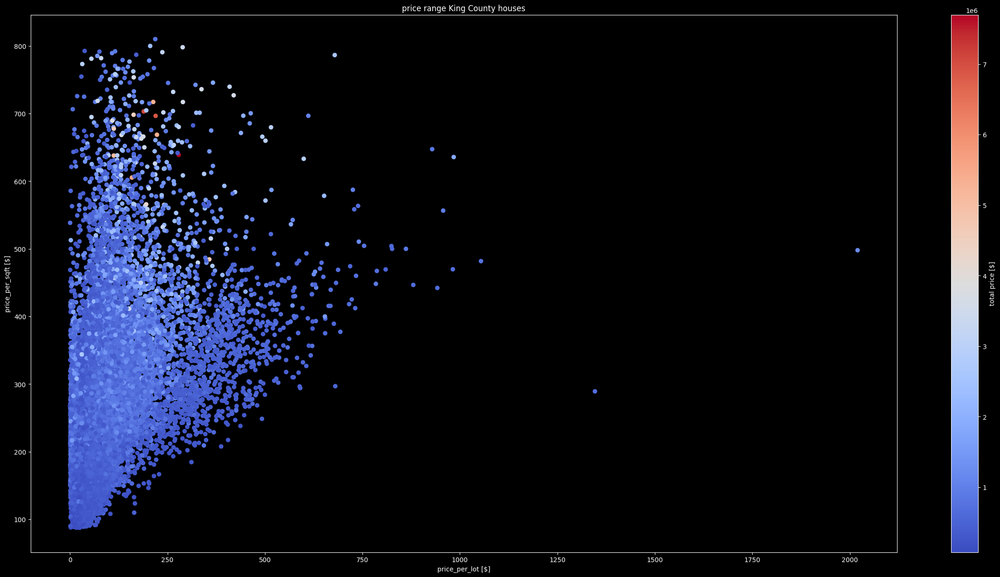

In [197]:
# prize overview
# colormaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html

import numpy as np
import matplotlib.pyplot as plt 

df = df_clean


plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(30,15))

plt.scatter(x = df['price_per_lot'], y = df['price_per_sqft'], c=df['price'],cmap='coolwarm') #cmap='viridis'
plt.xlabel("price_per_lot [$]")
plt.ylabel("price_per_sqft [$]")
plt.title("price range King County houses")
plt.colorbar(label="total price [$]")

# convert axes to Logarithmic scale
#plt.yscale("log")
#plt.xscale("log")

plt.show()

### create df_low_houses which includes houses with low price to sqft/lot size

In [10]:
df_low_houses = df_clean[(df_clean['price_per_lot']<= 250) & (df_clean['price_per_sqft']<= 500)].copy()

In [12]:
# remove duplicates from df_low_houses

In [123]:
# Pearson's correlation coefficient for all combinations, based on price_per_sqft
df_low_houses.corr()[['price','price_per_sqft','price_per_lot']].sort_values(by='price',ascending=False) #.index

,price,price_per_sqft,price_per_lot
price,1.000,0.522,0.430
sqft_living,0.744,-0.107,0.160
grade_normalized,0.710,0.097,0.216
grade,0.710,0.097,0.216
sqft_above,0.639,-0.102,0.108
sqft15_normalized,0.627,0.016,0.070
sqft_living15,0.627,0.016,0.070
bathrooms,0.557,-0.125,0.229
price_per_sqft,0.522,1.000,0.469
price_per_lot,0.430,0.469,1.000


In [201]:
# correlation coefficient for all combinations, based on price_per_sqft
df_low_houses.corr()[['price','price_per_sqft','price_per_lot']].sort_values(by='price_per_sqft',ascending=False)# .index

,price,price_per_sqft,price_per_lot
price_per_sqft,0.522,1.000,0.469
price,1.000,0.522,0.430
lat,0.358,0.521,0.342
price_per_lot,0.430,0.469,1.000
zipcode,-0.067,0.168,0.197
view,0.335,0.158,0.092
condition,0.016,0.139,-0.012
condition_normalized,0.016,0.139,-0.012
grade,0.710,0.097,0.216
grade_normalized,0.710,0.097,0.216


In [202]:
# Pearson's correlation coefficient for all combinations, based on price_per_lot
df_low_houses.corr()[['price','price_per_sqft','price_per_lot']].sort_values(by='price_per_lot',ascending=False)#.index

,price,price_per_sqft,price_per_lot
price_per_lot,0.430,0.469,1.000
price_per_sqft,0.522,1.000,0.469
price,1.000,0.522,0.430
lat,0.358,0.521,0.342
floors,0.313,-0.082,0.334
bathrooms,0.557,-0.125,0.229
grade,0.710,0.097,0.216
grade_normalized,0.710,0.097,0.216
zipcode,-0.067,0.168,0.197
sqft_living,0.744,-0.107,0.160


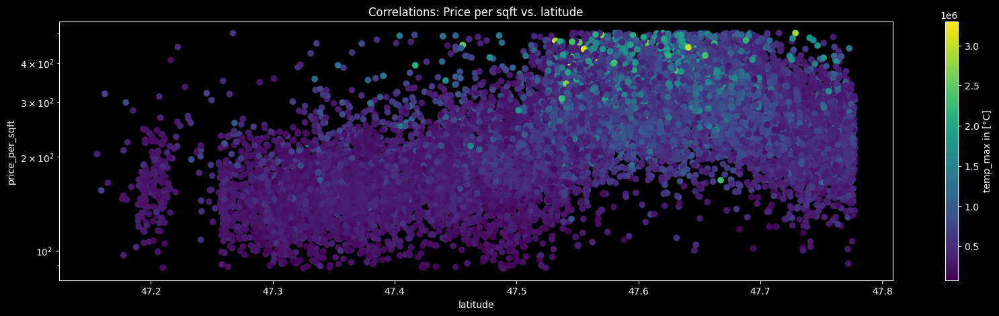

In [192]:
# colormaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html

# price per sqft correlates with 'price_per_sqft', 'price', 'lat', 'price_per_lot', 'zipcode', 'view','condition',

import numpy as np
import matplotlib.pyplot as plt 

df = df_low_houses


plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(20,5))

plt.scatter(x = df['lat'], y = df['price_per_sqft'], c=df['price'],cmap='viridis')
plt.xlabel("latitude")
plt.ylabel("price_per_sqft")
plt.title("Correlations: Price per sqft vs. latitude")
plt.colorbar(label="temp_max in [°C]")

# convert y-axis to Logarithmic scale
plt.yscale("log")

plt.show()

In [193]:
# binning latitude

df = df_low_houses.copy()

#create bin range, intervals and column name, with bins from 0 to 70 in intervals of 10:
bin_intervals = np.arange(45, 55, 0.05) 

# create the bin series e.g. for column "precipitation" ("include_lowest=True"-option includes zeros into the 0-10 bin)
bin_series = pd.cut(df['lat'], bins=bin_intervals,labels=bin_intervals[:-1],include_lowest=True) 

# name the series, name will appear as column name in the joined table
bin_series.name = 'bin_lat'


# join the bin series into the original dataframe
df2 = pd.concat([df, bin_series], axis=1)
df2 = df2.astype({'bin_lat': float})
df2['bin_lat'].round(2)
df2.head(30)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_lot15,date,price,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_per_sqft,price_per_lot,bin_lat
0,7129300520,3,1.000,1180,5650,1.000,0.000,0,3,7,...,5650,2014-10-13,221900,0.538,0.600,0.216,0.006,188.051,39.274,47.500
1,6414100192,3,2.250,2570,7242,2.000,0.000,0,3,7,...,7639,2014-12-09,538000,0.538,0.600,0.272,0.009,209.339,74.289,47.700
2,5631500400,2,1.000,770,10000,1.000,0.000,0,3,6,...,8062,2015-02-25,180000,0.462,0.600,0.438,0.009,233.766,18.000,47.700
3,2487200875,4,3.000,1960,5000,1.000,0.000,0,5,7,...,5000,2014-12-09,604000,0.538,1.000,0.219,0.006,308.163,120.800,47.500
4,1954400510,3,2.000,1680,8080,1.000,0.000,0,3,8,...,7503,2015-02-18,510000,0.615,0.600,0.290,0.009,303.571,63.119,47.600
5,7237550310,4,4.500,5420,101930,1.000,0.000,0,3,11,...,101930,2014-05-12,1230000,0.846,0.600,0.767,0.117,226.937,12.067,47.650
6,1321400060,3,2.250,1715,6819,2.000,0.000,0,3,7,...,6819,2014-06-27,257500,0.538,0.600,0.360,0.008,150.146,37.762,47.300
7,2008000270,3,1.500,1060,9711,1.000,0.000,0,3,7,...,9711,2015-01-15,291850,0.538,0.600,0.266,0.011,275.330,30.054,47.400
8,2414600126,3,1.000,1780,7470,1.000,0.000,0,3,7,...,8113,2015-04-15,229500,0.538,0.600,0.287,0.009,128.933,30.723,47.500
9,3793500160,3,2.500,1890,6560,2.000,0.000,0,3,7,...,7570,2015-03-12,323000,0.538,0.600,0.385,0.009,170.899,49.238,47.350


In [194]:

df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19541 entries, 0 to 21595
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    19541 non-null  int64  
 1   bedrooms              19541 non-null  int64  
 2   bathrooms             19541 non-null  float64
 3   sqft_living           19541 non-null  int64  
 4   sqft_lot              19541 non-null  int64  
 5   floors                19541 non-null  float64
 6   waterfront            19541 non-null  float64
 7   view                  19541 non-null  int64  
 8   condition             19541 non-null  int64  
 9   grade                 19541 non-null  int64  
 10  sqft_above            19541 non-null  int64  
 11  sqft_basement         19541 non-null  int64  
 12  yr_built              19541 non-null  int64  
 13  yr_renovated          19541 non-null  int64  
 14  zipcode               19541 non-null  int64  
 15  lat                

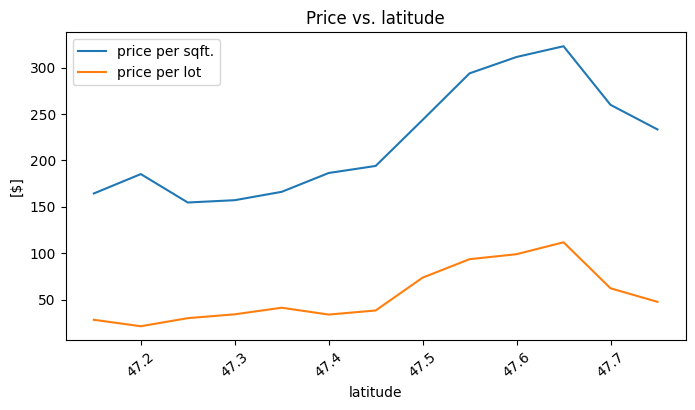

In [195]:
# correlation with latitude
#import pandas as pd
#import matplotlib.pyplot as plt
plt.style.use('default')


#data = pd.read_table('data', delim_whitespace=True)
data = df2.copy()

plt.figure(figsize=(8, 4))



avg_pricePerSqft = data.groupby('bin_lat')['price_per_sqft'].agg('mean')
avg_pricePerLot = data.groupby('bin_lat')['price_per_lot'].agg('mean')
avg_pricePerSqft.plot(label='price per sqft.')
avg_pricePerLot.plot(label='price per lot')
plt.xticks(rotation=40)
plt.title('Price vs. latitude')
plt.ylabel('[$]') 
plt.xlabel('latitude') 
plt.legend()
plt.show()

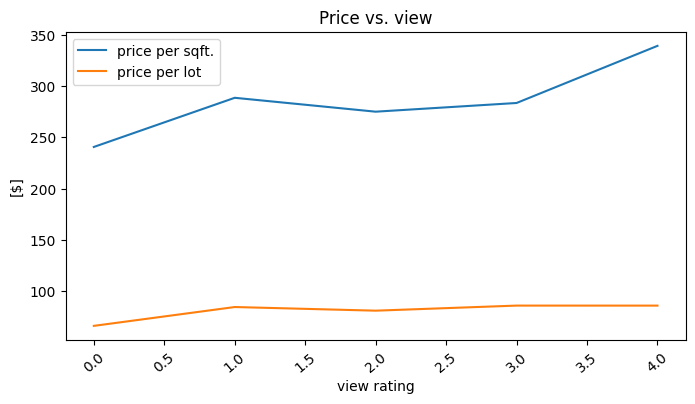

In [199]:
# view and condition
# correlation with latitude
#import pandas as pd
#import matplotlib.pyplot as plt
plt.style.use('default')


#data = pd.read_table('data', delim_whitespace=True)
data = df2.copy()

plt.figure(figsize=(8, 4))



avg_pricePerSqft = data.groupby('view')['price_per_sqft'].agg('mean')
avg_pricePerLot = data.groupby('view')['price_per_lot'].agg('mean')
avg_pricePerSqft.plot(label='price per sqft.')
avg_pricePerLot.plot(label='price per lot')
plt.xticks(rotation=40)
plt.title('Price vs. view')
plt.ylabel('[$]') 
plt.xlabel('view rating') 
plt.legend()
plt.show()

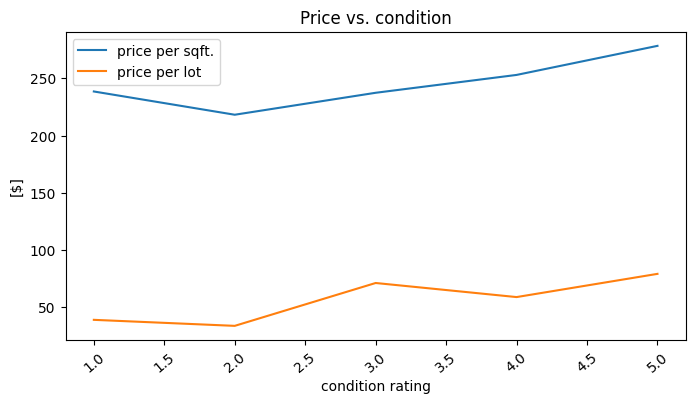

In [205]:
# view and condition
#import pandas as pd
#import matplotlib.pyplot as plt
plt.style.use('default')


#data = pd.read_table('data', delim_whitespace=True)
data = df2.copy()

plt.figure(figsize=(8, 4))



avg_pricePerSqft = data.groupby('condition')['price_per_sqft'].agg('mean')
avg_pricePerLot = data.groupby('condition')['price_per_lot'].agg('mean')
avg_pricePerSqft.plot(label='price per sqft.')
avg_pricePerLot.plot(label='price per lot')
plt.xticks(rotation=40)
plt.title('Price vs. condition')
plt.ylabel('[$]') 
plt.xlabel('condition rating') 
plt.legend()
plt.show()

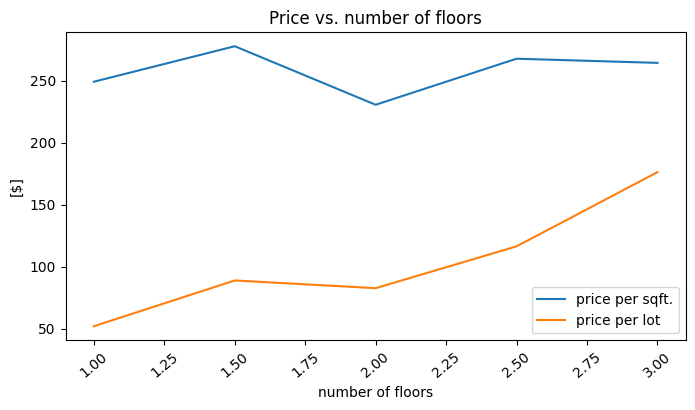

In [207]:
#floors 
#bathrooms 
#grade

#import pandas as pd
#import matplotlib.pyplot as plt
plt.style.use('default')


#data = pd.read_table('data', delim_whitespace=True)
data = df2.copy()

plt.figure(figsize=(8, 4))



avg_pricePerSqft = data.groupby('floors')['price_per_sqft'].agg('mean')
avg_pricePerLot = data.groupby('floors')['price_per_lot'].agg('mean')
avg_pricePerSqft.plot(label='price per sqft.')
avg_pricePerLot.plot(label='price per lot')
plt.xticks(rotation=40)
plt.title('Price vs. number of floors')
plt.ylabel('[$]') 
plt.xlabel('number of floors') 
plt.legend()
plt.show()

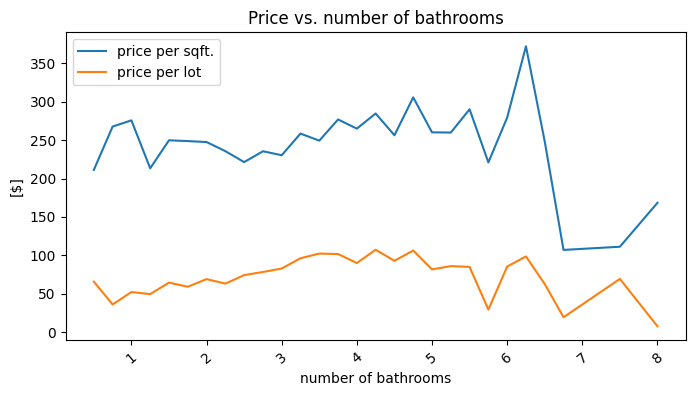

In [208]:
#floors 
#bathrooms 
#grade

#import pandas as pd
#import matplotlib.pyplot as plt
plt.style.use('default')


#data = pd.read_table('data', delim_whitespace=True)
data = df2.copy()

plt.figure(figsize=(8, 4))



avg_pricePerSqft = data.groupby('bathrooms')['price_per_sqft'].agg('mean')
avg_pricePerLot = data.groupby('bathrooms')['price_per_lot'].agg('mean')
avg_pricePerSqft.plot(label='price per sqft.')
avg_pricePerLot.plot(label='price per lot')
plt.xticks(rotation=40)
plt.title('Price vs. number of bathrooms')
plt.ylabel('[$]') 
plt.xlabel('number of bathrooms') 
plt.legend()
plt.show()

# Visualization

### Import libraries

In [15]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import altair as alt
import numpy as np
import geopandas as gpd
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

#sns.set_style("darkgrid")



In [3]:
# remind me of the column names please:
#list(df_clean.head(0))

### figure playground

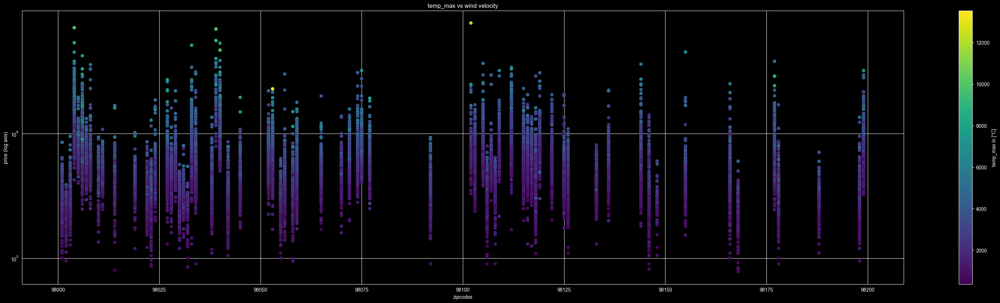

In [18]:
import numpy as np
import matplotlib.pyplot as plt 

df = df_clean


plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(40,10))

plt.scatter(x = df['zipcode'], y = df['price'], c=df['sqft_living'],cmap='viridis')
plt.xlabel("zipcodes")
plt.ylabel("price (log axis)")
plt.title("temp_max vs wind velocity")
plt.colorbar(label="temp_max in [°C]")

# convert y-axis to Logarithmic scale
plt.yscale("log")

plt.show()

In [15]:
list(df.head(0))

['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price',
 'grade_normalized',
 'condition_normalized',
 'sqft15_normalized',
 'lot15_normalized',
 'price_per_sqft',
 'price_per_lot']

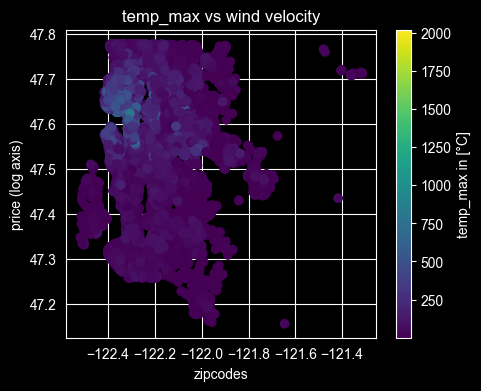

In [88]:
import numpy as np
import matplotlib.pyplot as plt 

df = df_clean.copy()


plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(5,4))

plt.scatter(x = df['long'], y = df['lat'], c=df['price_per_lot'],cmap='viridis')
plt.xlabel("zipcodes")
plt.ylabel("price (log axis)")
plt.title("temp_max vs wind velocity")
plt.colorbar(label="temp_max in [°C]")

# convert y-axis to Logarithmic scale
#plt.yscale("log")

plt.show()

In [37]:
print(df_clean['price'].median())
print(df_clean['price'].mean())
print((df_clean['price'].mean()+df_clean['price'].median())/2)

450000.0
540296.5735055795
495148.28675278975


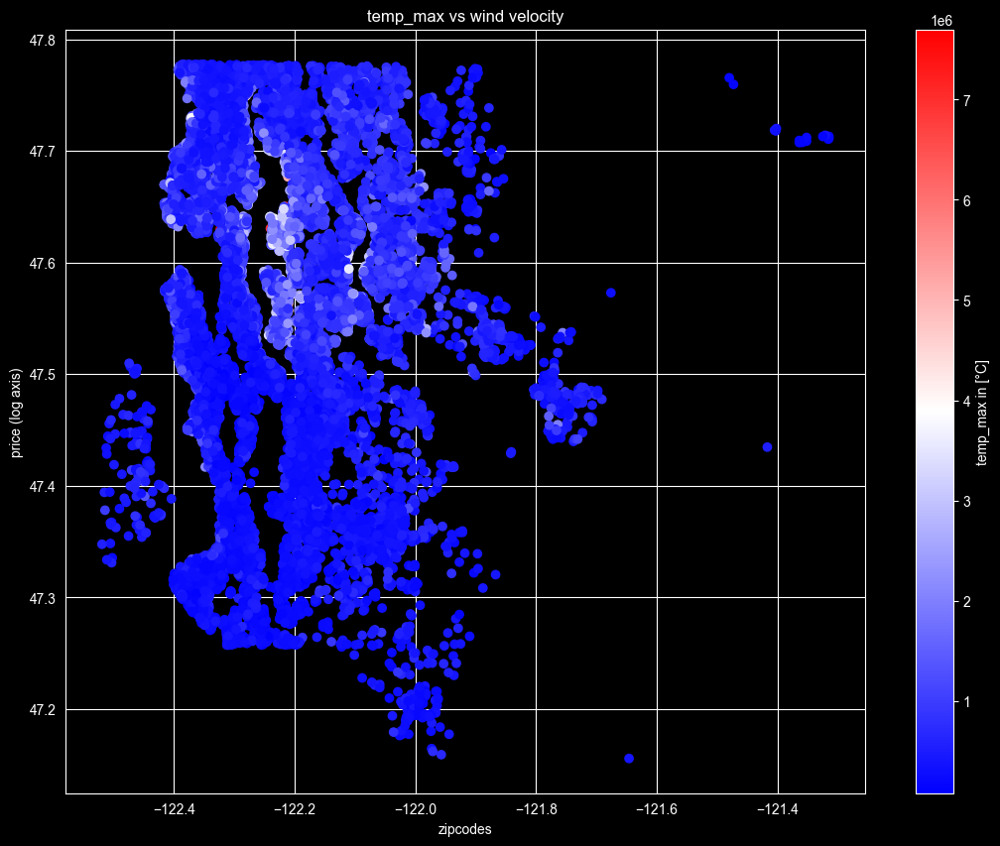

In [89]:
# colormaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html
df = df_clean #.price.sort_values()
#df.price.sort_values(ascending=True)

df.sort_values(by='price', ascending=False)

plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(13,10))

plt.scatter(x = df['long'], y = df['lat'], c=df['price'],cmap='bwr') #cmap='tab20c'
plt.xlabel("zipcodes")
plt.ylabel("price (log axis)")
plt.title("temp_max vs wind velocity")
plt.colorbar(label="temp_max in [°C]")

# convert y-axis to Logarithmic scale
#plt.yscale("log")

plt.show()

In [72]:
df_clean.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3,1.00,1180,5650,1.0,0.0,0,3,7,...,0,1955,0,98178,47.5112,-122.257,1340,5650,2014-10-13,221900
1,6414100192,3,2.25,2570,7242,2.0,0.0,0,3,7,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014-12-09,538000
2,5631500400,2,1.00,770,10000,1.0,0.0,0,3,6,...,0,1933,0,98028,47.7379,-122.233,2720,8062,2015-02-25,180000
3,2487200875,4,3.00,1960,5000,1.0,0.0,0,5,7,...,910,1965,0,98136,47.5208,-122.393,1360,5000,2014-12-09,604000
4,1954400510,3,2.00,1680,8080,1.0,0.0,0,3,8,...,0,1987,0,98074,47.6168,-122.045,1800,7503,2015-02-18,510000


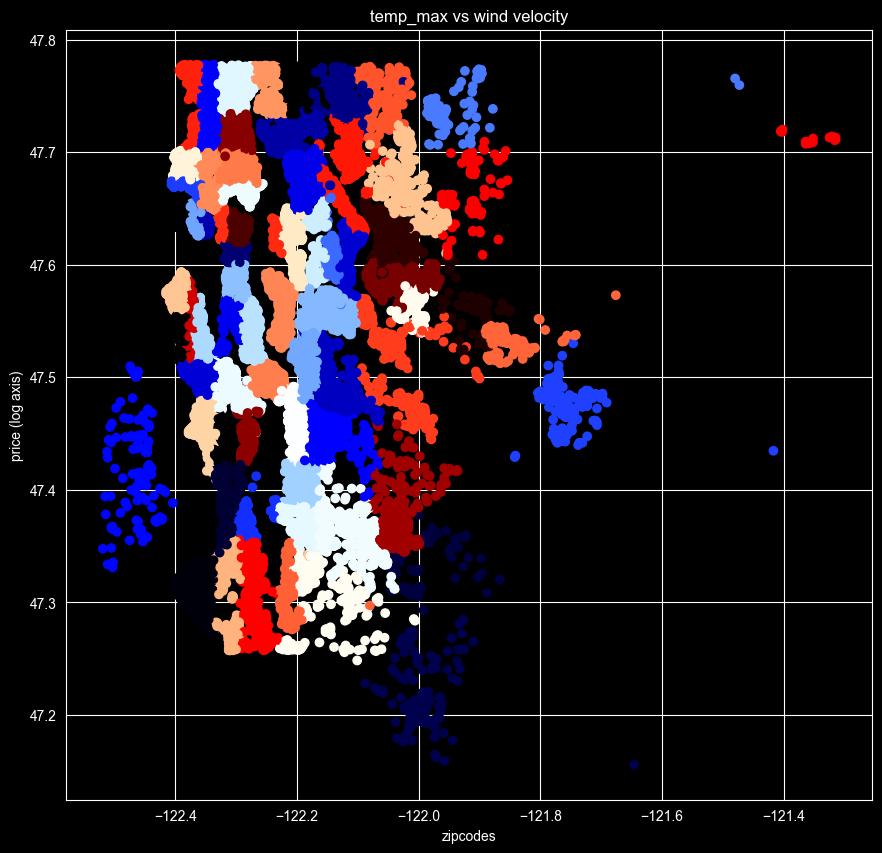

In [24]:
# colormaps: https://matplotlib.org/stable/tutorials/colors/colormaps.html
df = df_clean

plt.style.use('dark_background')
#plt.style.use('default')


fig, ax = plt.subplots(figsize=(10.4,10))

plt.scatter(x = df['long'], y = df['lat'], c=df['zipcode'],cmap='flag') #cmap='tab20c'
plt.xlabel("zipcodes")
plt.ylabel("price (log axis)")
plt.title("temp_max vs wind velocity")
#plt.colorbar(label="temp_max in [°C]")

# convert y-axis to Logarithmic scale
#plt.yscale("log")

plt.show()

In [83]:
# find center of geographical data to find map spot 
print('lat:', df_clean['lat'].mean())
print('long', df_clean['long'].mean())

lat: 47.56009299439737
long -122.21398254294577


In [90]:
# list the column names again please
list(df_clean.head())

['id',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15',
 'date',
 'price',
 'grade_normalized',
 'condition_normalized',
 'sqft15_normalized',
 'lot15_normalized',
 'price_per_sqft',
 'price_per_lot']

### from https://www.kaggle.com/code/balraj98/tsunami-data-interative-eda

In [16]:
import numpy as np
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [ ]:
# list the column names again please
list(df_clean.head())

In [23]:
# first test map

df2 = df_clean.sort_values(by='price_per_lot', ascending=False).head(200).copy()
df = df2.dropna(subset=['lat', 'long'])

#loc_folium = folium.Map(location=[df, LOCATION_DATA[0][1]], zoom_start=14)

location_kc=[df2['lat'].mean(),df2['long'].mean()]

map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=11)

for idx, row in df.iterrows():
    Marker([row['lat'], row['long']], icon=folium.Icon(color='blue', icon='bicycle', prefix='fa')).add_to(map_)

map_

### plotting expensive areas/lots

In [18]:
# volcano heatmaps for pricy areas

df2 = df_clean[df_clean['price']>=df_clean['price'].median()*4].copy()

df = df2.dropna(subset=['lat', 'long'])

location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]


from folium import plugins

map = folium.Map(location_kc, tiles="Cartodb dark_matter", zoom_start=11)

heat_data = [[row['lat'],row['long']] for index, row in df2.iterrows()]



heat_data
plugins.HeatMap(heat_data).add_to(map)

m = map

m

# couldn't get it to work in time but smth. like this would be nice:
#import io
#from PIL import Image
#
#img_data = m._to_png(5)
#img = Image.open(io.BytesIO(img_data))
#img.save('plots/price_per_lot_heatmap.png')



In [69]:
# This example uses heatmaps to visualize the density of volcanoes
# which is more in some parts of the world compared to others.

#df2 = df_clean.sort_values(by='price', ascending=False).head(200).copy()
df2 = df_clean[df_clean['price']>=df_clean['price'].median()*2.5].copy()

df = df2.dropna(subset=['lat', 'long'])

location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]


from folium import plugins

map = folium.Map(location_kc, tiles="Cartodb dark_matter", zoom_start=12)

heat_data = [[row['lat'],row['long']] for index, row in df2.iterrows()]



heat_data
plugins.HeatMap(heat_data).add_to(map)

m = map

m

#I use this:

#... where m is my map object. And 5 is the time (seconds) to render the map.

#import io
#from PIL import Image
#
#img_data = m._to_png(5)
#img = Image.open(io.BytesIO(img_data))
#img.save('plots/price_per_lot_heatmap.png')



### plotting less expensive lots

In [19]:
#df2 = df_clean.sort_values(by='price', ascending=False).head(200).copy()


import folium
from folium import plugins


df_low_houses = df_clean[(df_clean['price_per_lot']<= 250) & (df_clean['price_per_sqft']<= 500)].copy()

df2 = df_low_houses.sort_values(by='price').head(10000)

# setting center to middle of coordinates
location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]

map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=11)

for i in range(0,len(df2)):
    Circle(
        location=[df2.iloc[i]['lat'], df2.iloc[i]['long']],
        radius=20,
        color='green').add_to(map_)

map_


In [40]:

df2 = df_clean[df_clean['price_per_sqft']<=df_clean['price_per_sqft'].median()/1.5].copy()

map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=9)

for i in range(0,len(df2)):
    Circle(
        location=[df2.iloc[i]['lat'], df2.iloc[i]['long']],
        radius=20,
        color='green').add_to(map_)

map_

# Output suggested houses

In [20]:
# selection of interesting houses IN GOOD CONDITION, 3 BEDROOMS, 3 BATHROOMS, cheap 

df_selection=df_clean.query('price_per_lot < 125 and price_per_sqft < 250 and condition >= 5 and bedrooms >3 and bathrooms >3').copy()

import folium
from folium import plugins


location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]

#df2 = df_low_houses.sort_values(by='price_per_lot').head(500).copy()



map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=11)

for idx, row in df_selection.iterrows():
    Marker([row['lat'], row['long']], icon=folium.Icon(color='blue', icon='home', prefix='fa')).add_to(map_)

map_
#df_selection['id'].nunique()

In [247]:
df_low_houses.head(0)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,date,price,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_per_sqft,price_per_lot


In [21]:
# selection of interesting houses WITH LOW LOT PRICE

#df_low_houses = df_clean[(df_clean['price_per_lot']<= 250) & (df_clean['price_per_sqft']<= 500)].copy()
# example query: df.query('length <= 0.4 and length > 0.35 and weight_whole > 0.25 and weight_whole < 0.3')
df_selection=df_clean.query('price_per_lot < 2').copy()

import folium
from folium import plugins


location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]

#df2 = df_low_houses.sort_values(by='price_per_lot').head(500).copy()



map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=11)

for idx, row in df_selection.iterrows():
    Marker([row['lat'], row['long']], icon=folium.Icon(color='blue', icon='home', prefix='fa')).add_to(map_)

map_
#df_selection['id'].nunique()

In [226]:
df_selection['id'].nunique()

258

In [268]:
# selection of interesting houses WITH LOW LOT PRICE PER SQFT and GOOD CONDITION

#df_low_houses = df_clean[(df_clean['price_per_lot']<= 250) & (df_clean['price_per_sqft']<= 500)].copy()
# example query: df.query('length <= 0.4 and length > 0.35 and weight_whole > 0.25 and weight_whole < 0.3')
df_selection=df_clean.query('price_per_sqft < 130 and condition >= 5').copy()

import folium
from folium import plugins


location_kc=[df_clean['lat'].mean(),df_clean['long'].mean()]

#df2 = df_low_houses.sort_values(by='price_per_lot').head(500).copy()



map_ = folium.Map(location_kc, tiles='openstreetmap', zoom_start=11)

for idx, row in df_selection.iterrows():
    Marker([row['lat'], row['long']], icon=folium.Icon(color='blue', icon='home', prefix='fa')).add_to(map_)

map_
#df_selection['id'].nunique()

In [88]:
df_clean.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,long,sqft_living15,sqft_lot15,date,price,grade_normalized,condition_normalized,sqft15_normalized,lot15_normalized,price_per_sqft
0,7129300520,3,1.00,1180,5650,1.0,0.0,0,3,7,...,-122.257,1340,5650,2014-10-13,221900,0.538462,0.6,0.215781,0.006485,188.050847
1,6414100192,3,2.25,2570,7242,2.0,0.0,0,3,7,...,-122.319,1690,7639,2014-12-09,538000,0.538462,0.6,0.272142,0.008768,209.338521
2,5631500400,2,1.00,770,10000,1.0,0.0,0,3,6,...,-122.233,2720,8062,2015-02-25,180000,0.461538,0.6,0.438003,0.009254,233.766234
3,2487200875,4,3.00,1960,5000,1.0,0.0,0,5,7,...,-122.393,1360,5000,2014-12-09,604000,0.538462,1.0,0.219002,0.005739,308.163265
4,1954400510,3,2.00,1680,8080,1.0,0.0,0,3,8,...,-122.045,1800,7503,2015-02-18,510000,0.615385,0.6,0.289855,0.008612,303.571429


# to do
* make the selection logical
* touch up the code, change colour of markers